**Check In #1:**

Goal: Predicting the genre of a track

Our team has chosen the Hugging Face Spotify Tracks dataset.

The key features we have decided to study are **popularity, duration, danceability, energy, key, loudness, speechiness, acousticness, instrumentalness, liveness, valence, tempo**, track genre(for training) because these would be most useful for genre prediction.





In [1]:
%pip install datasets
%pip install plotly
%pip install matplotlib
%pip install seaborn
%pip install datascience
%pip install scikit-learn


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd

df = pd.read_csv("hf://datasets/maharshipandya/spotify-tracks-dataset/dataset.csv")
# df = pd.read_csv("/Users/briannanguyen/Desktop/spotify-tracks-dataset.csv")

c:\Users\WINDOWS\AppData\Local\Programs\Python\Python39\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from datascience import *
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt

In [4]:
df.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')

In [5]:
df.sample(10)

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
79592,79592,1sjLTFmGf51cdTCDhTAkqa,Smyang Piano,"Piano Collection, Vol. 4",Paradise,37,247669,False,0.274,0.0617,...,-24.157,0,0.0397,0.995000,0.927000,0.0917,0.0995,139.584,3,piano
83180,83180,5xiAkbnx5yEIF3o2GG3ako,Dimitri Vegas & Like Mike;KSHMR;Alok;Zafrir,Reunion (Free Fire 4th Anniversary Theme Song)...,Reunion (Free Fire 4th Anniversary Theme Song),44,158000,False,0.537,0.9100,...,-5.253,0,0.0817,0.000782,0.000010,0.1020,0.2510,128.049,4,progressive-house
109520,109520,0Pxo3J0alsDbf6bZTJ4cHR,Agoria;Blasé,Drift,You’re Not Alone,53,169041,False,0.698,0.7430,...,-5.507,0,0.0353,0.000291,0.417000,0.3960,0.4360,108.019,4,techno
47400,47400,4CvQVmA1wVX4gKOJ7aQOZQ,Guns N' Roses,Greatest Hits,Since I Don't Have You,41,259266,False,0.256,0.5790,...,-8.146,1,0.0460,0.489000,0.000226,0.1170,0.2540,70.968,4,hard-rock
5827,5827,5SHguvOUbyPTINNjCvRo8K,Mrs. GREEN APPLE,"Love me, Love you",春愁,65,183800,False,0.724,0.4440,...,-4.903,1,0.0412,0.012100,0.000000,0.1230,0.7390,129.962,4,anime
18422,18422,34KtRClZTrQT5r0BrHnARk,Andy Hendrickson,Underachiever,My Roommate Keith,22,172680,False,0.482,0.4700,...,-16.636,1,0.9470,0.919000,0.000000,0.6930,0.4170,71.713,4,comedy
63882,63882,2p6aaKWKgCvBhFG0jo2Lh2,KEYTALK,PARADISE,Summer Venus,31,214200,False,0.514,0.9070,...,-2.576,0,0.0713,0.000108,0.000000,0.3380,0.7150,151.806,4,j-rock
1711,1711,1r3UZRusrbX8rz9YdWj6rx,Whitefield Brothers,In The Raw,Yakuba,18,194813,False,0.809,0.9460,...,-4.464,1,0.0617,0.192000,0.798000,0.0577,0.9110,90.730,4,afrobeat
57972,57972,5DRUnUWYHCmuRNlYsWHHyp,Akanksha Bhandari,Raahi,Amma Puchdi,41,264444,False,0.531,0.3990,...,-9.089,1,0.0294,0.704000,0.000000,0.1150,0.2100,107.506,1,indie
6401,6401,0kco15ozQ8NHEeZSqgWZ0U,Rotting Christ;Lars Nedland,Holy Mountain,Holy Mountain,41,313209,False,0.444,0.7140,...,-8.159,0,0.0432,0.000176,0.176000,0.3020,0.1700,138.068,4,black-metal


The one missing row might be because the name and artists are in Korean since it is a k-pop genre song.



In [6]:
missing_prop = df.isna().sum() / len(df.index)
missing_prop.sort_values()
missing_rows = df[df.isna().any(axis=1)]

print("Number of missing data rows:", len(missing_rows))
print("Missing data rows:")
print(missing_rows)

Number of missing data rows: 1
Missing data rows:
       Unnamed: 0                track_id artists album_name track_name  \
65900       65900  1kR4gIb7nGxHPI3D2ifs59     NaN        NaN        NaN   

       popularity  duration_ms  explicit  danceability  energy  ...  loudness  \
65900           0            0     False         0.501   0.583  ...     -9.46   

       mode  speechiness  acousticness  instrumentalness  liveness  valence  \
65900     0       0.0605          0.69           0.00396    0.0747    0.734   

         tempo  time_signature  track_genre  
65900  138.391               4        k-pop  

[1 rows x 21 columns]


In [7]:
# list of number of tracks (rows) in each unique track_genre
for genre in df['track_genre'].unique():
  print(f"{genre}: {len(df[df['track_genre'] == genre])}")

acoustic: 1000
afrobeat: 1000
alt-rock: 1000
alternative: 1000
ambient: 1000
anime: 1000
black-metal: 1000
bluegrass: 1000
blues: 1000
brazil: 1000
breakbeat: 1000
british: 1000
cantopop: 1000
chicago-house: 1000
children: 1000
chill: 1000
classical: 1000
club: 1000
comedy: 1000
country: 1000
dance: 1000
dancehall: 1000
death-metal: 1000
deep-house: 1000
detroit-techno: 1000
disco: 1000
disney: 1000
drum-and-bass: 1000
dub: 1000
dubstep: 1000
edm: 1000
electro: 1000
electronic: 1000
emo: 1000
folk: 1000
forro: 1000
french: 1000
funk: 1000
garage: 1000
german: 1000
gospel: 1000
goth: 1000
grindcore: 1000
groove: 1000
grunge: 1000
guitar: 1000
happy: 1000
hard-rock: 1000
hardcore: 1000
hardstyle: 1000
heavy-metal: 1000
hip-hop: 1000
honky-tonk: 1000
house: 1000
idm: 1000
indian: 1000
indie-pop: 1000
indie: 1000
industrial: 1000
iranian: 1000
j-dance: 1000
j-idol: 1000
j-pop: 1000
j-rock: 1000
jazz: 1000
k-pop: 1000
kids: 1000
latin: 1000
latino: 1000
malay: 1000
mandopop: 1000
metal: 100

# **Data Cleaning:**

There is only 1 row missing some values, so we are removing this row.

In [8]:
df = df.dropna()
missing_prop = df.isna().sum() / len(df.index)
missing_prop.sort_values()
missing_rows = df[df.isna().any(axis=1)]

print("Number of missing data rows:", len(missing_rows))
print("Missing data rows:")
print(missing_rows)

Number of missing data rows: 0
Missing data rows:
Empty DataFrame
Columns: [Unnamed: 0, track_id, artists, album_name, track_name, popularity, duration_ms, explicit, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, time_signature, track_genre]
Index: []

[0 rows x 21 columns]


# **Exploratory Data Analysis:**

Average popularity per Genre

In [9]:
avg_popularity_per_genre = df.groupby('track_genre')['popularity'].mean().reset_index()
avg_popularity_per_genre.columns = ["Genre", "Avg Popularity"]
avg_popularity_per_genre = avg_popularity_per_genre.sort_values(by='Avg Popularity', ascending=False)

avg_popularity_per_genre

,Genre,Avg Popularity
81,pop-film,59.283000
65,k-pop,56.952953
15,chill,53.651000
94,sad,52.379000
44,grunge,49.594000
...,...,...
13,chicago-house,12.339000
24,detroit-techno,11.174000
67,latin,8.297000
93,romance,3.245000


Average Danceability Per Genre Table:

In [10]:
avg_dance_per_genre = df.groupby('track_genre')['danceability'].mean().reset_index()
avg_dance_per_genre.columns = ["Genre", "Avg Danceability"]
avg_dance_per_genre_sorted = avg_dance_per_genre.sort_values(by='Avg Danceability', ascending=True)
pd.set_option('display.max_rows', None)
print(avg_dance_per_genre_sorted)


                 Genre  Avg Danceability
101              sleep          0.167923
42           grindcore          0.271854
6          black-metal          0.296411
59             iranian          0.300686
76               opera          0.313563
75             new-age          0.348455
4              ambient          0.367867
22         death-metal          0.368411
16           classical          0.381923
113        world-music          0.414572
72           metalcore          0.423800
50         heavy-metal          0.428500
93             romance          0.432133
79               piano          0.455098
44              grunge          0.457062
26              disney          0.462874
98          show-tunes          0.463738
71               metal          0.464288
40              gospel          0.473298
82           power-pop          0.473410
41                goth          0.478875
47           hard-rock          0.482250
38              garage          0.484264
85              

Average Energy Value Per Genre Table:

In [11]:
avg_energy_per_genre = df.groupby('track_genre')['energy'].mean().reset_index()
avg_energy_per_genre.columns = ['Genre', 'Average Energy']
avg_energy_per_genre_sorted = avg_energy_per_genre.sort_values(by='Average Energy', ascending=True)
pd.set_option('display.max_rows', None)
print(avg_energy_per_genre_sorted)

                 Genre  Average Energy
16           classical        0.189827
75             new-age        0.214501
4              ambient        0.237162
93             romance        0.294304
26              disney        0.302519
76               opera        0.317054
79               piano        0.320103
45              guitar        0.324999
101              sleep        0.342072
64                jazz        0.352954
52          honky-tonk        0.366957
108              tango        0.372828
98          show-tunes        0.398742
105              study        0.410658
15               chill        0.426723
102         songwriter        0.434188
99   singer-songwriter        0.434188
0             acoustic        0.435368
12            cantopop        0.461696
94                 sad        0.462470
14            children        0.494645
70            mandopop        0.498434
11             british        0.507127
91         rock-n-roll        0.526615
7            bluegrass   

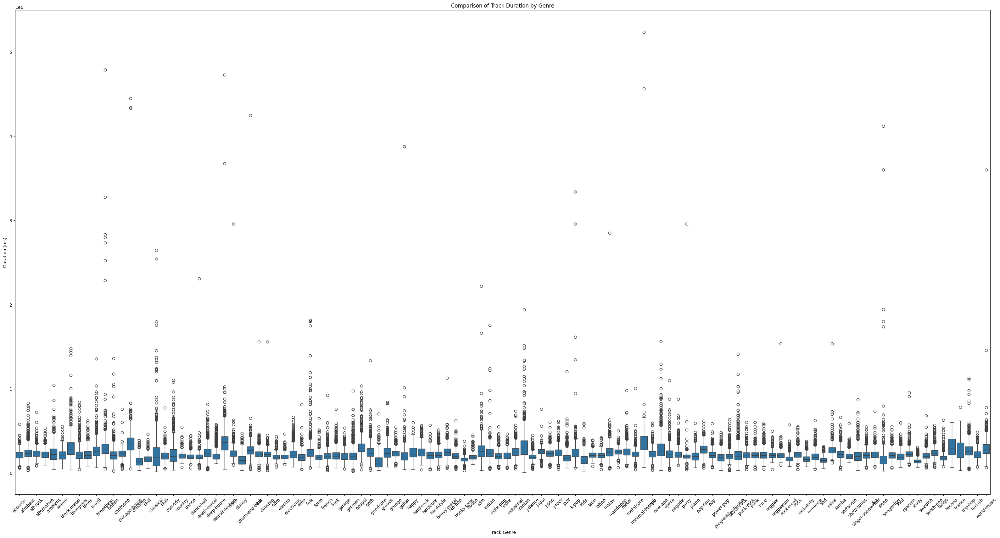

In [12]:
%matplotlib inline
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the plot size
plt.figure(figsize=(40, 20))

# Create a box plot
sns.boxplot(x='track_genre', y='duration_ms', data = df)

# Set labels and title
plt.title('Comparison of Track Duration by Genre')
plt.xlabel('Track Genre')
plt.ylabel('Duration (ms)')

# Rotate x labels for better readability if there are many genres
plt.xticks(rotation=45)

# Show the plot
plt.show()

# Week 3

In [13]:
from sklearn.model_selection import train_test_split

# note train_test_split shuffles the data set by default

# first split the dataset into 70% training and 30% temp
train_data, temp_data = train_test_split(df, test_size=0.3, random_state=42)

# then split the temp dataset into 15% testing and 15% validation
test_data, val_data = train_test_split(temp_data, test_size=0.5, random_state=42)

print(f'Training data shape: {train_data.shape}')
print(f'Testing data shape: {test_data.shape}')
print(f'Validation data shape: {val_data.shape}')

# If need to remake these datasets, uncomment to create new CSV files
# train_data.to_csv('csv/train_data.csv', index=False)
# test_data.to_csv('csv/test_data.csv', index=False)
# val_data.to_csv('csv/val_data.csv', index=False)

Training data shape: (79799, 21)
Testing data shape: (17100, 21)
Validation data shape: (17100, 21)


In [14]:
# for consistency, everyone should use the same datasets by reading the same csv files

train_data = pd.read_csv("./csv/train_data.csv")
test_data = pd.read_csv("./csv/test_data.csv")
val_data = pd.read_csv("./csv/val_data.csv")

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_scaled = []
y = []

for d in [train_data, test_data, val_data]:
    non_numeric_cols = d.select_dtypes(include=['object']).columns
    # print(non_numeric_cols)

    X = d.drop(columns=['popularity', 'track_id', 'track_name','album_name', 'artists', 'track_genre'])
    y.append(d['popularity'])

    # for lasso:
    scaler = StandardScaler()
    X_scaled.append(scaler.fit_transform(X))

In [16]:
# training data
X_train = X_scaled[0]
y_train = y[0]

# testing data
X_test = X_scaled[1]
y_test = y[1]

# validation data
X_val = X_scaled[2]
y_val = y[2]

### Regularization
We are using lasso regression (L1 Regularization)

In [17]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

lasso = Lasso(alpha=0.1) # try changing alpha to make it better!
lasso.fit(X_train, y_train)

y_val_pred = lasso.predict(X_val)
#MSE
val_mse = mean_squared_error(y_val, y_val_pred)
print(f"Validation MSE: {val_mse}")

lasso_coefficients = lasso.coef_
feature_names = X.columns
# feature_names = df.drop(columns=['popularity', 'track_id', 'track_name','album_name', 'artists', 'track_genre']).columns
important_features = [(feature, coef) for feature, coef in zip(feature_names, lasso_coefficients) if coef != 0]
important_features = sorted(important_features, key=lambda x: abs(x[1]), reverse=True)

print("Important Features:")
for feature, coef in important_features:
    print(f"{feature}: {coef}")

Validation MSE: 482.86028217945733
Important Features:
instrumentalness: -2.414702875009987
valence: -2.2671419290598616
speechiness: -1.418747157755636
danceability: 1.2105724310109753
explicit: 0.8757417797762873
Unnamed: 0: 0.4617996878219175
time_signature: 0.4068828297359902
tempo: 0.30046698670147104
mode: -0.2540433439760859
loudness: 0.2540127477409079
energy: -0.178837834347387
acousticness: -0.09365770338322728
duration_ms: -0.09162713619712619
liveness: 0.022333228072016768


 Based on these lasso regression results to find the most important predictors of popularity, we have decided to use Danceability as our predictors of popularity so we can apply linear regression. 
 
 One question we have: we are a bit confused about why valence is a big negative predictor of popularity. Some of the lasso regression results were did not exactly align with our own assumptions of what they should be. 

In [18]:
#Linear and LAD Regression Models
from sklego.linear_model import LADRegression
from sklearn.linear_model import LinearRegression

lad_fit = LADRegression()
lad_fit.fit(X_train, y_train)

ls_fit = LinearRegression()
ls_fit.fit(X_train,y_train)
print("Intercept: ", ls_fit.intercept_)
print("Coefficients: ", ls_fit.coef_[0])

Intercept:  33.2653007519
Coefficients:  0.556606970401


In [19]:
import plotly.graph_objects as go

# plot both the LS and LAD lines on top of the scatterplot of gr_liv_area against sale_price
fig = px.scatter(train_data, x='danceability', y='popularity')
fig.add_trace(
    go.Scatter(x=train_data['danceability'],
                y=lad_fit.intercept_ + train_data['danceability'] * lad_fit.coef_[0],
                mode='lines',
                name='LAD',
                line={'dash': 'dash',
                      'color': 'red'})
                # L1 model
)
fig.add_trace(
    go.Scatter(x=train_data['danceability'],
                y=ls_fit.intercept_ + train_data['danceability'] * ls_fit.coef_[0],
                mode='lines',
                name='LS',
                line={'dash': 'solid',
                      'color': 'black'})
                # L2 model
)
fig.update_traces(marker=dict(size=2))

Not great for visualization, let's try a different form of regression.

In [20]:
# Linear Model Evaluation

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Training Data
pred_train_df = pd.DataFrame( # dataframe to compare true value to predicted value
    {'true': y_train,
     'ls_pred': ls_fit.predict(np.array(X_train))})

# compute the rMSE, MAE, MAD, correlation and R2 of true value with predictions
print('LS rMSE:', np.sqrt(mean_squared_error(pred_train_df['true'], pred_train_df['ls_pred'])))
print('LS MAE:', mean_absolute_error(pred_train_df['true'], pred_train_df['ls_pred']))
print('LS MAD:', np.median(np.abs(pred_train_df['true'] - pred_train_df['ls_pred'])))
print('LS correlation:', np.corrcoef(pred_train_df['true'], pred_train_df['ls_pred'])[0, 1])
print('LS R2:', r2_score(pred_train_df['true'], pred_train_df['ls_pred']))

# Validation Data
pred_val_df = pd.DataFrame( # dataframe to compare true value to predicted value
    {'true': y_val,
     'ls_pred': ls_fit.predict(np.array(X_val))})

# compute the rMSE, MAE, MAD, correlation and R2 of true value with predictions
print('LS rMSE:', np.sqrt(mean_squared_error(pred_val_df['true'], pred_val_df['ls_pred'])))
print('LS MAE:', mean_absolute_error(pred_val_df['true'], pred_val_df['ls_pred']))
print('LS MAD:', np.median(np.abs(pred_val_df['true'] - pred_val_df['ls_pred'])))
print('LS correlation:', np.corrcoef(pred_val_df['true'], pred_val_df['ls_pred'])[0, 1])
print('LS R2:', r2_score(pred_val_df['true'], pred_val_df['ls_pred']))

LS rMSE: 22.0393643843
LS MAE: 18.378427291
LS MAD: 15.9652304617
LS correlation: 0.161013356635
LS R2: 0.02592530101480972
LS rMSE: 21.9695910058
LS MAE: 18.3143020336
LS MAD: 15.8762158042
LS correlation: 0.157469512411
LS R2: 0.02470036472170345


#### Applying Ridge Regression

In [21]:
# for ridge regression
X = df.drop(columns=['popularity', 'track_id', 'track_name','album_name', 'artists', 'track_genre'])
y = df['popularity']

In [22]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold, cross_validate, learning_curve


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print(X_scaled.shape)

alphas = np.logspace(-1, 6, 100)
kf = KFold(n_splits=10, shuffle=True, random_state=42)


ridge_cv_scores = []
for alpha in alphas:
  ridge = Ridge(alpha=alpha)
  ridge_cv = cross_validate(estimator=ridge,
                              X=X_scaled,
                              y=y,
                              cv=kf,
                              scoring='neg_root_mean_squared_error')
  ridge_cv_scores.append({'alpha': alpha,
                            'log_alpha': np.log(alpha),
                            'test_mse': -np.mean(ridge_cv['test_score'])})

ridge_cv_scores_df = pd.DataFrame(ridge_cv_scores)
px.line(ridge_cv_scores_df,
        x='log_alpha',
        y='test_mse',
        title='Ridge')  

#find best alpha
ridge_alpha_min = ridge_cv_scores_df.sort_values(by='test_mse').head(1).alpha.values[0]

mse_se_ridge = ridge_cv_scores_df['test_mse'].std() / np.sqrt(10)
mse_min_ridge = ridge_cv_scores_df['test_mse'].min()

ridge_alpha_1se = ridge_cv_scores_df[(ridge_cv_scores_df['test_mse'] <= mse_min_ridge + mse_se_ridge) &
                                     (ridge_cv_scores_df['test_mse'] >= mse_min_ridge - mse_se_ridge)].sort_values(by='alpha', ascending=False).head(1).alpha.values[0]

print('Ridge (min): ', ridge_alpha_min)
print('Ridge (1SE): ', ridge_alpha_1se)

ridge_min_fit = Ridge(alpha=ridge_alpha_min).fit(X=X_scaled, y=y)
ridge_1se_fit = Ridge(alpha=ridge_alpha_1se).fit(X=X_scaled, y=y)




(113999, 15)
Ridge (min):  403.70172586
Ridge (1SE):  23644.8941265


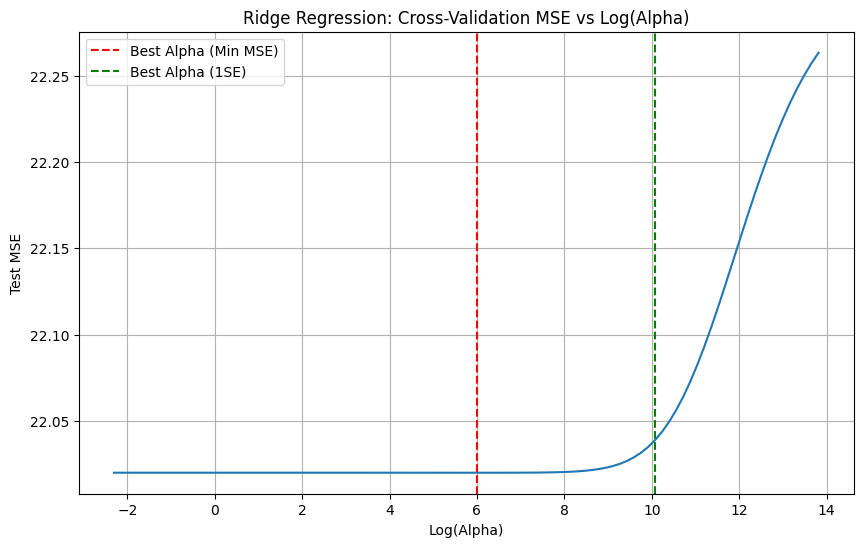

In [23]:
plt.figure(figsize=(10, 6))
plt.plot(ridge_cv_scores_df['log_alpha'], ridge_cv_scores_df['test_mse'])
plt.title('Ridge Regression: Cross-Validation MSE vs Log(Alpha)')
plt.xlabel('Log(Alpha)')
plt.ylabel('Test MSE')
plt.axvline(x=np.log(ridge_alpha_min), color='r', linestyle='--', label='Best Alpha (Min MSE)')
plt.axvline(x=np.log(ridge_alpha_1se), color='g', linestyle='--', label='Best Alpha (1SE)')
plt.legend()
plt.grid()
plt.show()


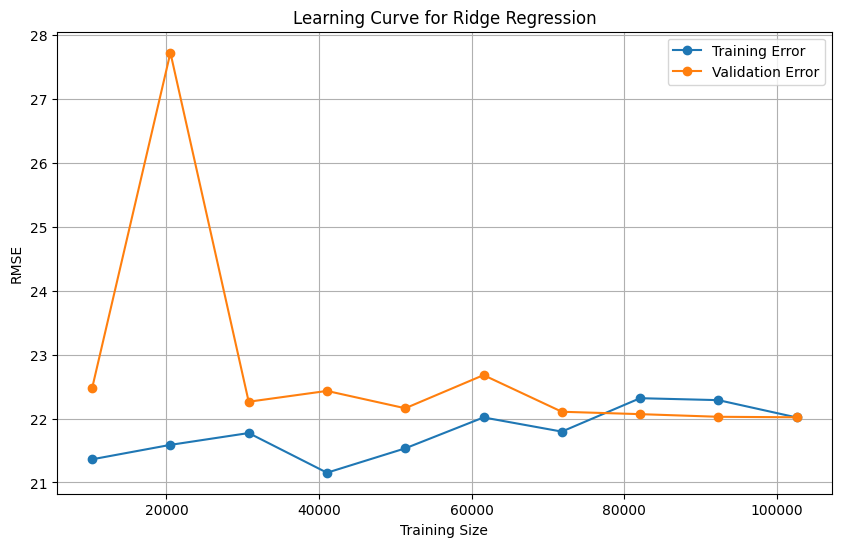

In [24]:
train_sizes, train_scores, test_scores = learning_curve(
    Ridge(alpha=ridge_alpha_min), X_scaled, y, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), cv=kf, scoring='neg_root_mean_squared_error'
)
train_scores_mean = -np.mean(train_scores, axis=1)  # Negate to convert from negative RMSE to positive
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = -np.mean(test_scores, axis=1)    # Negate to convert from negative RMSE to positive
test_scores_std = np.std(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training Error', marker='o')
plt.plot(train_sizes, test_scores_mean, label='Validation Error', marker='o')
plt.title('Learning Curve for Ridge Regression')
plt.xlabel('Training Size')
plt.ylabel('RMSE')
plt.legend()
plt.grid()
plt.show()

# Overfitting or Underfitting?
This graph shows that from 20000 to about 30000 (training size), the training error and validation error gap being really big means the model is overfitting, meaning the model isn't good at generalizing at this smaller size. Then the error gap decreases after 40000 and continues to improve.

# WEEK 4

Logistic Regression

We are choosing mode as our response variable for logistic regression.



In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_curve

In [26]:
non_numeric_cols = df.select_dtypes(exclude=[np.number]).columns.tolist()
print(non_numeric_cols)
numeric_df = df.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()
mode_correlation = correlation_matrix['mode'].sort_values(ascending=False)
print(mode_correlation)

fig = px.imshow(correlation_matrix, text_auto=True)
fig.update_layout(title='Correlation Matrix')
fig.show()

['track_id', 'artists', 'album_name', 'track_name', 'explicit', 'track_genre']
mode                1.000000
acousticness        0.095568
valence             0.021964
liveness            0.014004
Unnamed: 0          0.005110
tempo               0.000572
popularity         -0.013948
time_signature     -0.024090
duration_ms        -0.035581
loudness           -0.041768
speechiness        -0.046535
instrumentalness   -0.049961
danceability       -0.069224
energy             -0.078365
key                -0.135911
Name: mode, dtype: float64


Although none of the variables show a particularly strong correlation with mode, we will be using **key, acousticness, and energy** as they still were the most correlated. Another option we could have chosen to perform logistic regression on was the "explicit" variable, but there was too large of a class imbalance so we chose mode instead. 

In [27]:
response = df['mode']

In [28]:
X = df[['acousticness', 'energy', 'key']]
y = df['mode']

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=22)

In [30]:
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [31]:
# prediction accuracy and error
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Prediction Accuracy: {accuracy * 100:.2f}%")
print(f"Prediction Error: {(1-accuracy) * 100:.2f}%")

Prediction Accuracy: 64.77%
Prediction Error: 35.23%


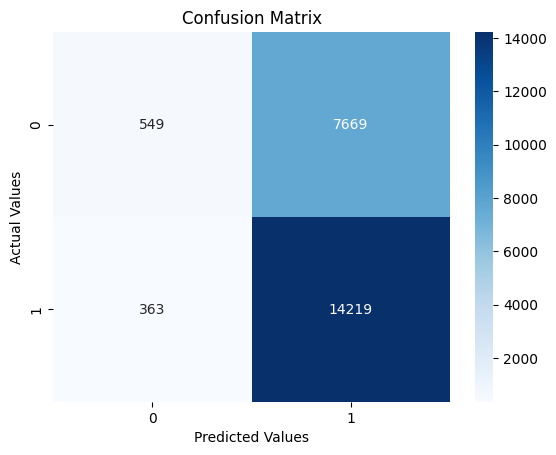

In [32]:
# confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.ylabel("Actual Values")
plt.xlabel("Predicted Values")
plt.show()

In [33]:
# True posiive and negative rate
truePositiveRate = cm[1,1] / (cm[1,1] + cm[1,0])
falsePositiveRate = cm[0,1] / (cm[0,1] + cm[0,0])
print(f"True Positive Rate: {truePositiveRate:.2f}")
print(f"True Negative Rate: {falsePositiveRate:.2f}")

True Positive Rate: 0.98
True Negative Rate: 0.93


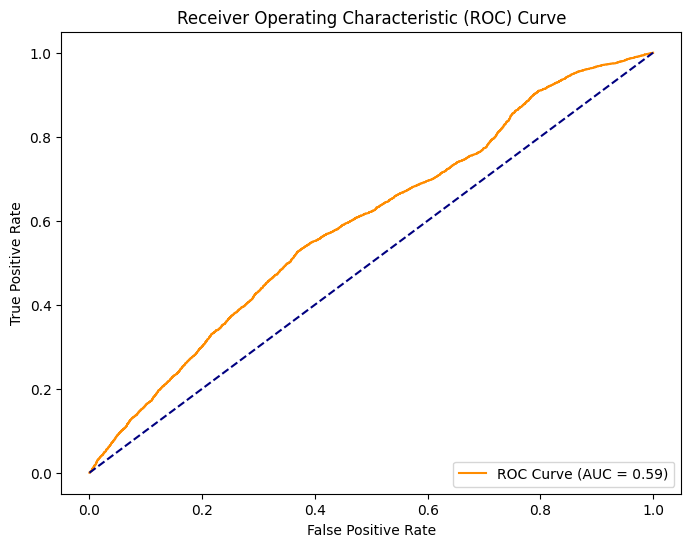

optimal_threshold:  0.649974884131


In [34]:
# ROC Curve
y_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = roc_auc_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='darkorange')
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
print('optimal_threshold: ', optimal_threshold)

In [35]:
from sklearn.model_selection import cross_val_score

# --------------------------
# K-Fold Cross-Validation
# --------------------------

# We'll use the previously selected features for this exercise (or all features if you haven't done feature selection yet)
X_cv =  X
y_cv =  y

# Initialize the logistic regression model
model_cv = LogisticRegression()

# Perform 5-Fold Cross-Validation
cv_scores = cross_val_score(model_cv, X_cv, y_cv, cv=5)

# Output the cross-validation scores for each fold
# Modify the printed scores to the acutal cv_scores
print(f"Cross-Validation Scores for each fold: {cv_scores}")
print(f"Mean Cross-Validation Accuracy: {np.mean(cv_scores) * 100:.2f}%")


Cross-Validation Scores for each fold: [ 0.64342105  0.64320175  0.64969298  0.6452193   0.64331769]
Mean Cross-Validation Accuracy: 64.50%


5. To choose a threshold for positive predictions, we examined the ROC curve and which showed how true positive rate (TPR) and false positive rate (FPR) change as the threshold varies, and we used the AUC score as a measure of overall model performance.
We selected a threshold of 0.65 from calculating the optimal threshold where where (TPR - FPR) is maximized.

If we want to improve the ROC and AUC, we can convert one of the numerical variables to a categorical one, and perform logistic regression on that. 

# Week 5

Applying KNN for the energy feature:

In [36]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder

To split the energy feature into a binary feature, we are specifying the threshold to be the 75th percentile. So the top 25% of tracks will be "high", and everything else is "low".

In [37]:
df_copy = df.copy()
threshold = df_copy['energy'].median()

df_copy["energy_level"] = df_copy['energy'].apply(lambda x: "high" if x>=threshold else "low")

#encode as 0 or 1 (1 = high, 0 = low)
le = LabelEncoder()
df_copy['energy_level'] = le.fit_transform(df_copy['energy_level'])

# dropping energy_level, and the non numerical features
X = df_copy[['loudness', 'acousticness']]
y = df_copy['energy_level']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [38]:
knn1 = KNeighborsClassifier(n_neighbors=1)
knn15 = KNeighborsClassifier(n_neighbors=15)
knn25 = KNeighborsClassifier(n_neighbors=25)

In [39]:
knn1.fit(X_train, y_train)
knn15.fit(X_train, y_train)
knn25.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=25)

In [40]:
y_pred1 = knn1.predict(X_test)
y_pred15 = knn15.predict(X_test)
y_pred25 = knn25.predict(X_test)

In [41]:
accuracy1 = accuracy_score(y_test, y_pred1)
accuracy15 = accuracy_score(y_test, y_pred15)
accuracy25 = accuracy_score(y_test, y_pred25)

print(accuracy1)
print(accuracy15)
print(accuracy25)

0.8476608187134503
0.8319005847953216
0.8300292397660819


In [42]:

from sklearn.metrics import confusion_matrix, accuracy_score, f1_score
model_cv.fit(X_train, y_train)

# this function may help to manually make confusion table from a different threshold
def t_repredict(model_cv, t, X_train):
    probs = model_cv.predict_proba(X_train)
    p0 = probs[:,0]
    p1 = probs[:,1]
    ypred = (p1 > t)*1
    return ypred

# default threshold
y_pred_train = t_repredict(model_cv, 0.5, X_train)

# Our decided threshold
threshold= 0.65
y_pred_train = t_repredict(model_cv, threshold, X_train)

# Confusion Matrix
conf_matrix_train = confusion_matrix(y_train, y_pred_train)
TN, FP, FN, TP = conf_matrix_train.ravel()  # Extract TN, FP, FN, TP from the matrix

# Prediction Accuracy
accuracy = accuracy_score(y_train, y_pred_train)

# Prediction Error (1 - accuracy)
error = 1 - accuracy

# True Positive Rate (Sensitivity / Recall)
true_positive_rate = TP / (TP + FN)

# True Negative Rate (Specificity)
true_negative_rate = TN / (TN + FP)

# F1 Score
f1 = f1_score(y_train, y_pred_train)

# Display results
print("Confusion Matrix:\n", conf_matrix_train)
print("Prediction Accuracy:", accuracy)
print("Prediction Error:", error)
print("True Positive Rate (Recall/Sensitivity):", true_positive_rate)
print("True Negative Rate (Specificity):", true_negative_rate)
print("F1 Score:", f1)

Confusion Matrix:
 [[36557  3401]
 [13300 26541]]
Prediction Accuracy: 0.7907116630534218
Prediction Error: 0.20928833694657822
True Positive Rate (Recall/Sensitivity): 0.666173037825
True Negative Rate (Specificity): 0.914885629911
F1 Score: 0.760672370061


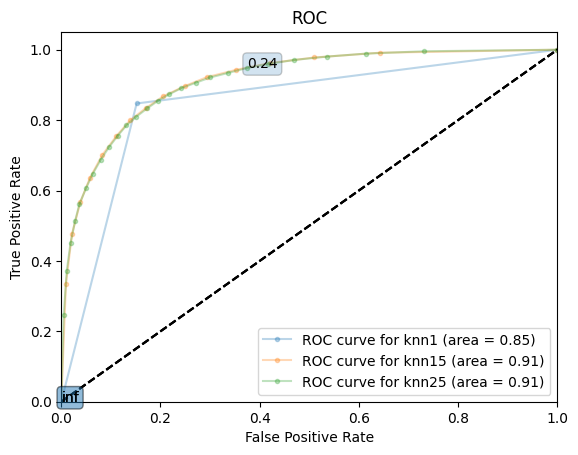

In [43]:
from sklearn.metrics import roc_curve, auc

# a function to make 'pretty' ROC curves for this model
def make_roc(name, clf, ytest, xtest, ax=None, labe=5, proba=True, skip=0):
    initial=False
    if not ax:
        ax=plt.gca()
        initial=True
    if proba:#for stuff like logistic regression
        fpr, tpr, thresholds=roc_curve(ytest, clf.predict_proba(xtest)[:,1])
    else:#for stuff like SVM
        fpr, tpr, thresholds=roc_curve(ytest, clf.decision_function(xtest))
    roc_auc = auc(fpr, tpr)
    if skip:
        l=fpr.shape[0]
        ax.plot(fpr[0:l:skip], tpr[0:l:skip], '.-', alpha=0.3, label='ROC curve for %s (area = %0.2f)' % (name, roc_auc))
    else:
        ax.plot(fpr, tpr, '.-', alpha=0.3, label='ROC curve for %s (area = %0.2f)' % (name, roc_auc))
    label_kwargs = {}
    label_kwargs['bbox'] = dict(
        boxstyle='round,pad=0.3', alpha=0.2,
    )
    if labe!=None:
        for k in range(0, fpr.shape[0],labe):
            threshold = str(np.round(thresholds[k], 2))
            ax.annotate(threshold, (fpr[k], tpr[k]), **label_kwargs)
    if initial:
        ax.plot([0, 1], [0, 1], 'k--')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title('ROC')
    ax.legend(loc="lower right")
    return ax


make_roc("knn1", knn1, y_test, X_test, ax=None, labe=20, proba=True, skip=1);
make_roc("knn15", knn15, y_test, X_test, ax=None, labe=20, proba=True, skip=1);
make_roc("knn25", knn25, y_test, X_test, ax=None, labe=20, proba=True, skip=1);

In [44]:
from sklearn.model_selection import cross_val_score

# --------------------------
# K-Fold Cross-Validation
# --------------------------

# We'll use the previously selected features for this exercise (or all features if you haven't done feature selection yet)
X_cv =  X
y_cv =  y

# Perform 5-Fold Cross-Validation
cv_scores_knn1 = cross_val_score(knn1, X_cv, y_cv, cv=5)
cv_scores_knn15 = cross_val_score(knn15, X_cv, y_cv, cv=5)
cv_scores_knn25 = cross_val_score(knn25, X_cv, y_cv, cv=5)

# Output the cross-validation scores for each fold
# Modify the printed scores to the acutal cv_scores
print(f"Cross-Validation Scores for each fold for knn1: {cv_scores_knn1}")
print(f"Mean Cross-Validation Accuracy for knn1: {np.mean(cv_scores_knn1) * 100:.2f}%")

print(f"Cross-Validation Scores for each fold for knn15: {cv_scores_knn15}")
print(f"Mean Cross-Validation Accuracy for knn15: {np.mean(cv_scores_knn15) * 100:.2f}%")

print(f"Cross-Validation Scores for each fold for knn25: {cv_scores_knn25}")
print(f"Mean Cross-Validation Accuracyfor knn25: {np.mean(cv_scores_knn25) * 100:.2f}%")

Cross-Validation Scores for each fold for knn1: [ 0.82263158  0.8120614   0.84184211  0.85837719  0.7959121 ]
Mean Cross-Validation Accuracy for knn1: 82.62%
Cross-Validation Scores for each fold for knn15: [ 0.8247807   0.79622807  0.84065789  0.845       0.79288565]
Mean Cross-Validation Accuracy for knn15: 81.99%
Cross-Validation Scores for each fold for knn25: [ 0.82412281  0.79342105  0.84052632  0.84315789  0.79082416]
Mean Cross-Validation Accuracyfor knn25: 81.84%


# Week 7 (Check-In 5)


## Clustering Code

We are interested in examining similarities and patterns in musical features amongst different artists and track genres.

We will begin by selecting our desired features, normalizing and scaling them. This is important because we want to ensure that out model will not be heavily impacted by outliers and allows no feature to outweigh the other in our clustering algorithm.

In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
get_ipython().run_line_magic('matplotlib', 'inline')
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering

In [46]:
# remove first two irrelevant columns
clusterdf = df.iloc[:, 2:]
clusterdf.head(3)

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.461,1,-6.746,0,0.1430,0.0322,0.000001,0.358,0.715,87.917,4,acoustic
1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.166,1,-17.235,1,0.0763,0.9240,0.000006,0.101,0.267,77.489,4,acoustic
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.359,0,-9.734,1,0.0557,0.2100,0.000000,0.117,0.120,76.332,4,acoustic


In [47]:
# Remove columns
clusterdf = clusterdf[['artists', 'track_genre', 'popularity', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo']]

# Normalize data
clusterdf.iloc[:, 2:] = clusterdf.iloc[:, 2:].apply(lambda x: (x -min(x))/(max(x)-min(x)))

# Scale data
ss = StandardScaler()
clusterdf_ss = ss.fit_transform(clusterdf.drop(['artists', 'track_genre'],axis=1))

C:\Users\WINDOWS\AppData\Local\Temp\ipykernel_1432\638978981.py:5: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0         0.73
1         0.55
2         0.57
3         0.71
4         0.82
5         0.58
6         0.74
7         0.80
8         0.74
9         0.56
10        0.74
11        0.69
12        0.52
13        0.62
14        0.56
15        0.58
16        0.56
17        0.54
18        0.68
19        0.67
20        0.75
21        0.63
22        0.70
23        0.00
24        0.00
25        0.01
26        0.00
27        0.00
28        0.00
29        0.00
30        0.00
31        0.00
32        0.00
33        0.00
34        0.00
35        0.00
36        0.00
37        0.00
38        0.00
39        0.00
40        0.00
41        0.00
42        0.00
43        0.00
44        0.00
45        0.00
46        0.00
47        0.00
48        0.00
49        0.00
50        0.46
51        0.61
52        0.60
53        0.68
54  

### K-Means

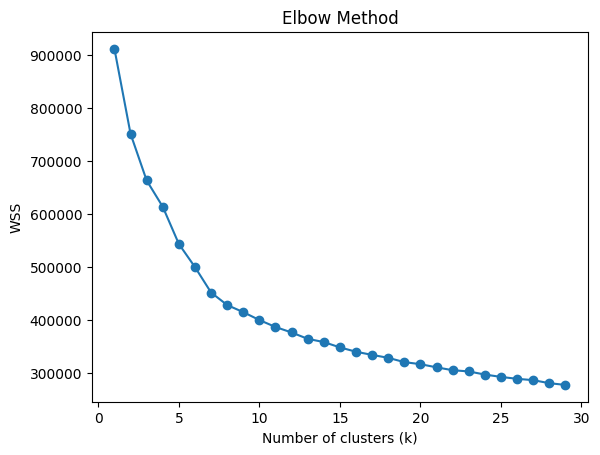

In [48]:
# Determine best k-value
wss = []
for k in range(1, 30):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(clusterdf_ss)
    wss.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 30), wss, marker='o')
plt.xlabel("Number of clusters (k)")
plt.ylabel("WSS")
plt.title("Elbow Method")
plt.show()

In order to determine the best k value, we will evaluate the WSS at various k's and select the k with the lowest WSS and smallest k (Elbow Method). However, based on the plot, we can see that the WSS seems to decrease over all values of k (0,30) so we will just use k=7 as it is where the eblow point is on the eblow plot. 

In [ ]:
# Apply k-means with k=7
kmeans = KMeans(n_clusters=7)
y_kmeans = kmeans.fit_predict(clusterdf_ss)
centroids = kmeans.cluster_centers_

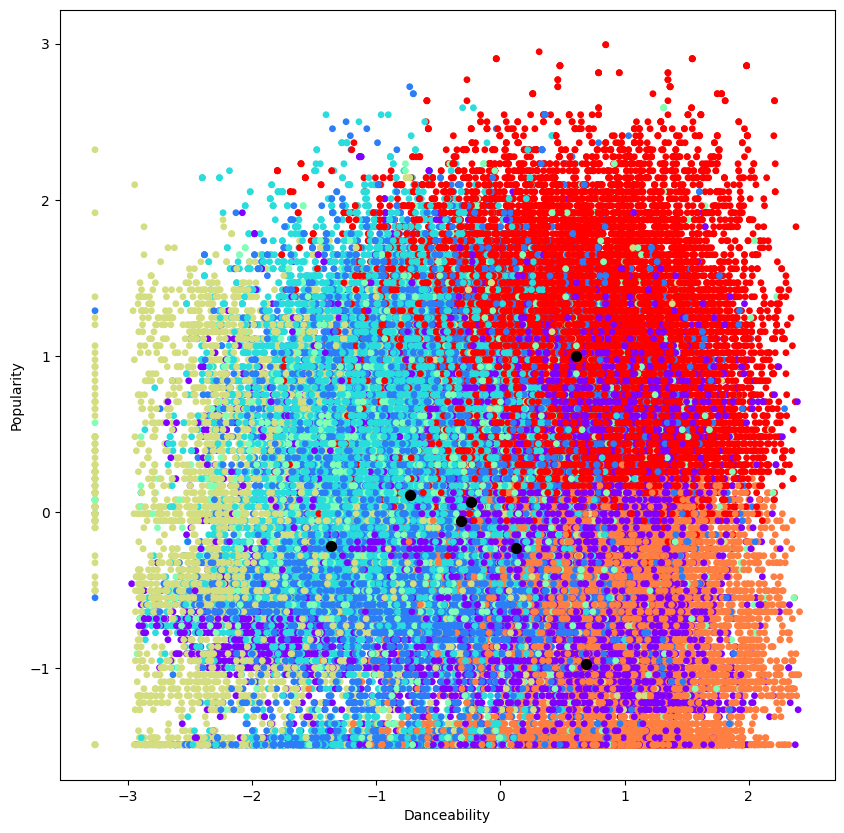

In [61]:
# Visualizing the k-means clusters using popularity and danceabiity
plt.figure(figsize=(10,10))
scatter = plt.scatter(clusterdf_ss[:,1], clusterdf_ss[:,0], c = y_kmeans, cmap='rainbow', s = 15)
plt.scatter(centroids[:, 1], centroids[:, 0], c='black', s=50)
plt.xlabel('Danceability')
plt.ylabel('Popularity')
plt.show()

In [51]:
# Group artists and genres together 
print(len(kmeans.labels_))
label = pd.DataFrame(kmeans.labels_.reshape(113999,1), columns=['labels'])
combinedArtists = pd.concat([clusterdf['artists'], label], axis=1)
combinedGenres = pd.concat([clusterdf['track_genre'], label], axis=1)
artistsKMeans = list(combinedArtists.groupby('labels')['artists'].unique())
genreKMeans = list(combinedGenres.groupby('labels')['track_genre'].unique())

113999


### Hierarchal Clustering

In [52]:
# Apply hierarchal clustering with k=10
# hclust = AgglomerativeClustering(n_clusters=10, metric='euclidean', linkage='ward')
# hclust_labels = hclust.fit(clusterdf_ss).labels_

In [53]:
#Visualize clusters using popularity and danceability
# plt.figure(figsize=(10,10))
# plt.scatter(clusterdf_ss[:,1], clusterdf_ss[:,0], c = hclust_labels, cmap='rainbow')
# plt.xlabel('Danceability')
# plt.ylabel('Popularity')
# plt.show()

In [54]:
# Group artists and genres together 
# artistsHClust = combinedArtists.copy()
# genresHClust = combinedGenres.copy()

# artistsHClust['labels'] = hclust.fit_predict(clusterdf_ss)
# genresHClust['labels'] = hclust.fit_predict(clusterdf_ss)

# list(artistsHClust.groupby('labels')['artists'].unique())
# list(genresHClust.groupby('labels')['track_genre'].unique())

## Quantitative Metrics

In [55]:
from sklearn.metrics import silhouette_score, silhouette_samples, rand_score, adjusted_rand_score

In [56]:
print('K-Means Inertia:', round(kmeans.inertia_, 1), '\n')
#print('K-Means Silhouette Score', silhouette_score(clusterdf_ss, y_kmeans), '\n')

# print('Hierarchial Silhouette Score', silhouette_score(clusterdf_ss, hclust_labels), '\n')
# print('Rand Score:', rand_score(y_kmeans, golfers_hclust_labels))

K-Means Inertia: 451882.1 



Conclusion

Clustering allows us to learn about similarities in various spotify scores between different artists and track genres. For instance, from the K-means plot above showing the popularity and dancebility of the different clusters. We can see that there are two clusters with high danceability (light blue and light orange). However, light blue tends to be more popular. It would be interesting to find other features in which these two cluster differ in order to explore specific features that makes a danceable song more popular.  